In [1]:
from keras.models import Sequential
from keras.layers import Dense, Conv2D
from keras.preprocessing import image
from keras import metrics
from keras.losses import mean_squared_error
from keras.callbacks import TensorBoard
from keras import backend as K
from keras.optimizers import Adam

from time import time

import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import os
from pathlib import Path

Using TensorFlow backend.


In [2]:
# We can use FP16 to fit a bigger model in memory, although the increase in batch size is not worth the overhead
f16 = False
if f16 == True:
    from keras.backend.common import set_floatx
    set_floatx('float16')
    from BN16 import BatchNormalizationF16

import tensorflow as tf
config = tf.ConfigProto()
config.gpu_options.allow_growth=True  # Prevents tf from allocating the whole GPU memory, so we can see the effect of increasing batch size on GPU memory consumption
sess = tf.Session(config=config)

In [3]:
def path2XY(img_path):
    img = image.load_img(img_path, target_size=(256, 256))
    
    '''
    img_gray = np.mean(img, axis=2)
    img_gray = np.array(img_gray.reshape(256,256,1))

    '''
    img_gray = (cv2.cvtColor(np.array(img),cv2.COLOR_RGB2GRAY)).reshape(256,256,1)
    X = img_gray/255.
    #Y = np.array(img)/255.
    
    img = cv2.cvtColor(np.array(img),cv2.COLOR_RGB2LAB)
    Y = img/255.
    
    return X, Y

def lab2rgb(x, denorm = True): 
    if denorm == True:
        x = (x*255.).astype('uint8')
    return cv2.cvtColor(x,cv2.COLOR_LAB2RGB)

def denorm_to_plot(img): return cv2.cvtColor((img*255).astype('uint8'), cv2.COLOR_GRAY2RGB)

In [4]:
folder  = Path("cats")
image_paths = [folder/f for f in os.listdir(folder) if f.endswith('.jpg')]

In [17]:
# V3 U-NET with regularization
from keras.layers import Input, Conv2D, Conv2DTranspose, BatchNormalization, Activation, UpSampling2D, concatenate, Dropout
from keras.models import Model

rows= 256
cols = 256
channels_in = 1

kernel_size = (3,3)

input_img = Input(shape=(rows, cols, channels_in))

def encode_layer(x, n_filters):
    x = Conv2D(n_filters, kernel_size, strides = 2, padding='same', activation='relu')(x)
    x = Dropout(0.1)(x)
    if f16 == True:
        x = BatchNormalizationF16()(x)
    else:
        x = BatchNormalization()(x)
    return x

def decode_layer(x, x_enc, n_filters):
    #x = UpSampling2D(size=(2, 2), data_format=None, interpolation='nearest')(x)
    #x = Conv2D(n_filters, kernel_size, strides = 1, padding='same', activation='relu')(x)
    x = Conv2DTranspose(n_filters, kernel_size, strides = 2, padding='same', activation='relu')(x)
    x = Dropout(0.1)(x)
    if f16 == True:
        x = BatchNormalizationF16()(x)
    else:
        x = BatchNormalization()(x)
    x = concatenate([x,x_enc])
    return x

input_img = Input(shape=(rows, cols, channels_in)) # 256, 256, 1

x_1_enc = encode_layer(input_img, 64) # 128, 128, 64
x_2_enc = encode_layer(x_1_enc, 128) # 64, 64, 128
x_3_enc = encode_layer(x_2_enc, 256) # 32,32,256

x_4_enc = encode_layer(x_3_enc, 512)

x_0_dec = decode_layer(x_4_enc, x_3_enc, 256)
x_1_dec = decode_layer(x_0_dec, x_2_enc, 128) #  x_0 [32,32,256] expands to [64,64,256].  64, 64, 64+64
x_2_dec = decode_layer(x_1_dec, x_1_enc, 64) # x_1_dec[64,64,128] expands to [128,128,128]. 128, 128, 128+1
x_3_dec = decode_layer(x_2_dec, input_img, 64)

# Last layer is a 1 by 1 convolution with 3 channels output
out = Conv2D(3, (1,1), strides=1, padding='same', activation='sigmoid')(x_3_dec)

model = Model(input_img, out)

opt = Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)

model.compile(loss='mean_squared_error',#mean_absolute_error_none,#
              optimizer=opt)       
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            (None, 256, 256, 1)  0                                            
__________________________________________________________________________________________________
conv2d_11 (Conv2D)              (None, 128, 128, 64) 640         input_6[0][0]                    
__________________________________________________________________________________________________
dropout_17 (Dropout)            (None, 128, 128, 64) 0           conv2d_11[0][0]                  
__________________________________________________________________________________________________
batch_normalization_17 (BatchNo (None, 128, 128, 64) 256         dropout_17[0][0]                 
__________________________________________________________________________________________________
conv2d_12 

In [19]:
# Model utilities:
from keras.utils import Sequence
from keras.callbacks import TensorBoard, ModelCheckpoint
class MySeq(Sequence):

    def __init__(self, x_set, batch_size):
        self.x = x_set
        self.batch_size = batch_size

    def __len__(self):
        return int(np.ceil(len(self.x) / float(self.batch_size)))

    def __getitem__(self, idx):
        batch_x = self.x[idx * self.batch_size:(idx + 1) * self.batch_size]
        X = []
        Y = []
        for path in batch_x:
            x, y = path2XY(path)
            X.append(x)
            Y.append(y)
        return np.asarray(X), np.asarray(Y)

# Batch size
if f16 == True:
    batch_size = 32
else:
    batch_size = 24
    
# Callbacks:
# tensorboard --logdir=D:\imageColorization\logs
tensorboarder = TensorBoard(log_dir='./logs', histogram_freq=0, batch_size=32, write_graph=True, write_grads=False, write_images=False, embeddings_freq=0, embeddings_layer_names=None, embeddings_metadata=None, embeddings_data=None, update_freq='epoch')
checkpointer  = ModelCheckpoint("./models/weights.{epoch:03d}-{val_loss:.5e}.hdf5", monitor='val_loss', verbose=0, save_best_only=False, save_weights_only=False, mode='auto', period=100)
    
training_examples = 9000
validation_examples = 500
training_batch_generator = MySeq(image_paths[0:training_examples], batch_size)
#training_batch_generator = MySeq(image_paths[-40:], batch_size)

validation_batch_generator = MySeq(image_paths[training_examples:training_examples+validation_examples], batch_size)

In [44]:
#hist = model.fit_generator(training_batch_generator, epochs=100, validation_data=validation_batch_generator, callbacks = [tensorboarder, checkpointer])
                                      #use_multiprocessing=True,
                                    #  workers=16,
                                     # max_queue_size=32)

KeyboardInterrupt: 

 Train with a different lr:

In [8]:
opt = Adam(lr=0.0001, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False) #lr=0.005
model.compile(loss='mean_squared_error',optimizer=opt) #mean_absolute_error_none,#
hist = model.fit_generator(training_batch_generator, epochs=100000, validation_data=validation_batch_generator, callbacks = [tensorboarder, checkpointer])

Epoch 1/100000
375/375 [==============================] - 103s 274ms/step - loss: 0.0062 - val_loss: 0.0024
Epoch 2/100000
375/375 [==============================] - 75s 199ms/step - loss: 0.0024 - val_loss: 0.0019
Epoch 3/100000
375/375 [==============================] - 75s 199ms/step - loss: 0.0022 - val_loss: 0.0018
Epoch 4/100000
375/375 [==============================] - 75s 199ms/step - loss: 0.0022 - val_loss: 0.0018
Epoch 5/100000
375/375 [==============================] - 75s 199ms/step - loss: 0.0021 - val_loss: 0.0017
Epoch 6/100000
375/375 [==============================] - 75s 199ms/step - loss: 0.0021 - val_loss: 0.0017
Epoch 7/100000
375/375 [==============================] - 75s 199ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 8/100000
375/375 [==============================] - 75s 199ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 9/100000
375/375 [==============================] - 75s 199ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 10/100000
375/375 [===========

375/375 [==============================] - 74s 198ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 77/100000
375/375 [==============================] - 74s 198ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 78/100000
375/375 [==============================] - 74s 198ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 79/100000
375/375 [==============================] - 74s 198ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 80/100000
375/375 [==============================] - 74s 198ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 81/100000
375/375 [==============================] - 74s 198ms/step - loss: 0.0016 - val_loss: 0.0017
Epoch 82/100000
375/375 [==============================] - 74s 198ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 83/100000
375/375 [==============================] - 74s 198ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 84/100000
375/375 [==============================] - 74s 198ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 85/100000
375/375 [===================

375/375 [==============================] - 74s 198ms/step - loss: 0.0010 - val_loss: 0.0019
Epoch 152/100000
375/375 [==============================] - 74s 198ms/step - loss: 0.0010 - val_loss: 0.0018
Epoch 153/100000
375/375 [==============================] - 74s 198ms/step - loss: 0.0010 - val_loss: 0.0019
Epoch 154/100000
375/375 [==============================] - 74s 198ms/step - loss: 9.9333e-04 - val_loss: 0.0018
Epoch 155/100000
375/375 [==============================] - 74s 198ms/step - loss: 9.9043e-04 - val_loss: 0.0019
Epoch 156/100000
375/375 [==============================] - 74s 198ms/step - loss: 9.9099e-04 - val_loss: 0.0019
Epoch 157/100000
375/375 [==============================] - 74s 198ms/step - loss: 9.8547e-04 - val_loss: 0.0019
Epoch 158/100000
375/375 [==============================] - 74s 198ms/step - loss: 9.6665e-04 - val_loss: 0.0019
Epoch 159/100000
375/375 [==============================] - 74s 198ms/step - loss: 9.6099e-04 - val_loss: 0.0019
Epoch 160/10

375/375 [==============================] - 74s 198ms/step - loss: 6.4093e-04 - val_loss: 0.0020
Epoch 224/100000
375/375 [==============================] - 74s 198ms/step - loss: 6.4218e-04 - val_loss: 0.0020
Epoch 225/100000
375/375 [==============================] - 74s 198ms/step - loss: 6.3666e-04 - val_loss: 0.0020
Epoch 226/100000
375/375 [==============================] - 74s 198ms/step - loss: 6.3866e-04 - val_loss: 0.0020
Epoch 227/100000
375/375 [==============================] - 74s 198ms/step - loss: 6.5295e-04 - val_loss: 0.0020
Epoch 228/100000
375/375 [==============================] - 74s 198ms/step - loss: 6.2736e-04 - val_loss: 0.0020
Epoch 229/100000
375/375 [==============================] - 74s 198ms/step - loss: 6.3004e-04 - val_loss: 0.0020
Epoch 230/100000
375/375 [==============================] - 74s 198ms/step - loss: 6.2165e-04 - val_loss: 0.0020
Epoch 231/100000
375/375 [==============================] - 74s 198ms/step - loss: 6.3025e-04 - val_loss: 0.0020


375/375 [==============================] - 74s 198ms/step - loss: 5.1684e-04 - val_loss: 0.0020
Epoch 296/100000
375/375 [==============================] - 74s 198ms/step - loss: 5.1494e-04 - val_loss: 0.0020
Epoch 297/100000
375/375 [==============================] - 74s 198ms/step - loss: 5.1308e-04 - val_loss: 0.0021
Epoch 298/100000
375/375 [==============================] - 74s 198ms/step - loss: 5.0817e-04 - val_loss: 0.0020
Epoch 299/100000
375/375 [==============================] - 74s 198ms/step - loss: 5.1339e-04 - val_loss: 0.0020
Epoch 300/100000
375/375 [==============================] - 74s 198ms/step - loss: 5.1648e-04 - val_loss: 0.0020
Epoch 301/100000
375/375 [==============================] - 74s 198ms/step - loss: 5.2354e-04 - val_loss: 0.0020
Epoch 302/100000
375/375 [==============================] - 74s 198ms/step - loss: 5.0511e-04 - val_loss: 0.0020
Epoch 303/100000
375/375 [==============================] - 74s 198ms/step - loss: 5.0354e-04 - val_loss: 0.0020


375/375 [==============================] - 74s 198ms/step - loss: 4.4695e-04 - val_loss: 0.0021
Epoch 368/100000
375/375 [==============================] - 74s 198ms/step - loss: 4.5805e-04 - val_loss: 0.0021
Epoch 369/100000
375/375 [==============================] - 74s 198ms/step - loss: 4.4948e-04 - val_loss: 0.0021
Epoch 370/100000
375/375 [==============================] - 74s 198ms/step - loss: 4.4652e-04 - val_loss: 0.0021
Epoch 371/100000
375/375 [==============================] - 74s 198ms/step - loss: 4.5023e-04 - val_loss: 0.0021
Epoch 372/100000
375/375 [==============================] - 74s 198ms/step - loss: 4.5776e-04 - val_loss: 0.0021
Epoch 373/100000
375/375 [==============================] - 74s 198ms/step - loss: 4.5351e-04 - val_loss: 0.0021
Epoch 374/100000
375/375 [==============================] - 74s 198ms/step - loss: 4.6360e-04 - val_loss: 0.0021
Epoch 375/100000
375/375 [==============================] - 74s 198ms/step - loss: 4.4181e-04 - val_loss: 0.0021


375/375 [==============================] - 74s 198ms/step - loss: 4.1488e-04 - val_loss: 0.0021
Epoch 440/100000
375/375 [==============================] - 74s 198ms/step - loss: 4.2473e-04 - val_loss: 0.0021
Epoch 441/100000
375/375 [==============================] - 74s 198ms/step - loss: 4.1886e-04 - val_loss: 0.0021
Epoch 442/100000
375/375 [==============================] - 74s 198ms/step - loss: 4.1834e-04 - val_loss: 0.0021
Epoch 443/100000
375/375 [==============================] - 74s 198ms/step - loss: 4.1756e-04 - val_loss: 0.0021
Epoch 444/100000
375/375 [==============================] - 74s 198ms/step - loss: 4.1657e-04 - val_loss: 0.0021
Epoch 445/100000
375/375 [==============================] - 74s 198ms/step - loss: 4.1516e-04 - val_loss: 0.0021
Epoch 446/100000
375/375 [==============================] - 74s 198ms/step - loss: 4.1436e-04 - val_loss: 0.0021
Epoch 447/100000
375/375 [==============================] - 74s 198ms/step - loss: 4.1782e-04 - val_loss: 0.0021


375/375 [==============================] - 74s 198ms/step - loss: 3.9405e-04 - val_loss: 0.0021
Epoch 512/100000
375/375 [==============================] - 74s 198ms/step - loss: 3.9229e-04 - val_loss: 0.0021
Epoch 513/100000
375/375 [==============================] - 74s 198ms/step - loss: 3.9558e-04 - val_loss: 0.0021
Epoch 514/100000
375/375 [==============================] - 74s 198ms/step - loss: 3.9146e-04 - val_loss: 0.0021
Epoch 515/100000
375/375 [==============================] - 74s 198ms/step - loss: 3.9504e-04 - val_loss: 0.0021
Epoch 516/100000
375/375 [==============================] - 74s 198ms/step - loss: 3.9694e-04 - val_loss: 0.0021
Epoch 517/100000
375/375 [==============================] - 74s 198ms/step - loss: 3.9326e-04 - val_loss: 0.0021
Epoch 518/100000
375/375 [==============================] - 74s 198ms/step - loss: 3.9327e-04 - val_loss: 0.0021
Epoch 519/100000
375/375 [==============================] - 74s 198ms/step - loss: 3.9110e-04 - val_loss: 0.0021


KeyboardInterrupt: 

In [20]:
# Let's try 100 epochs with dropout 0.1

In [24]:
hist = model.fit_generator(training_batch_generator, epochs=100, validation_data=validation_batch_generator, callbacks = [tensorboarder, checkpointer])

Epoch 1/100
375/375 [==============================] - 102s 271ms/step - loss: 0.0021 - val_loss: 0.0017
Epoch 2/100
375/375 [==============================] - 96s 257ms/step - loss: 0.0021 - val_loss: 0.0017
Epoch 3/100
375/375 [==============================] - 95s 255ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4/100
375/375 [==============================] - 95s 255ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 5/100
375/375 [==============================] - 96s 255ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 6/100
375/375 [==============================] - 95s 255ms/step - loss: 0.0020 - val_loss: 0.0028
Epoch 7/100
375/375 [==============================] - 96s 257ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 8/100
375/375 [==============================] - 96s 256ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 9/100
375/375 [==============================] - 96s 256ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 10/100
375/375 [==============================] - 96s 256

375/375 [==============================] - 96s 256ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 80/100
375/375 [==============================] - 95s 254ms/step - loss: 0.0017 - val_loss: 0.0018
Epoch 81/100
375/375 [==============================] - 96s 255ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 82/100
375/375 [==============================] - 95s 255ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 83/100
375/375 [==============================] - 96s 255ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 84/100
375/375 [==============================] - 95s 254ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 85/100
375/375 [==============================] - 95s 254ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 86/100
375/375 [==============================] - 96s 255ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 87/100
375/375 [==============================] - 95s 254ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 88/100
375/375 [==============================] - 96s 256ms/st

In [68]:
hist = model.fit_generator(training_batch_generator, epochs=100, validation_data=validation_batch_generator, callbacks = [tensorboarder, checkpointer])

Epoch 1/100
34/34 [==============================] - 7s 217ms/step - loss: 9.4683e-04 - val_loss: 0.0022
Epoch 2/100
34/34 [==============================] - 7s 211ms/step - loss: 9.3327e-04 - val_loss: 0.0021
Epoch 3/100
34/34 [==============================] - 7s 212ms/step - loss: 9.4317e-04 - val_loss: 0.0023
Epoch 4/100
34/34 [==============================] - 7s 212ms/step - loss: 9.1417e-04 - val_loss: 0.0024
Epoch 5/100
34/34 [==============================] - 7s 212ms/step - loss: 9.0862e-04 - val_loss: 0.0022
Epoch 6/100
34/34 [==============================] - 7s 212ms/step - loss: 8.4907e-04 - val_loss: 0.0023
Epoch 7/100
34/34 [==============================] - 7s 212ms/step - loss: 8.3703e-04 - val_loss: 0.0022
Epoch 8/100
34/34 [==============================] - 7s 212ms/step - loss: 8.6726e-04 - val_loss: 0.0032
Epoch 9/100
34/34 [==============================] - 7s 216ms/step - loss: 8.5784e-04 - val_loss: 0.0023
Epoch 10/100
34/34 [==============================] - 7

In [72]:
hist = model.fit_generator(training_batch_generator, epochs=100, validation_data=validation_batch_generator, callbacks = [tensorboarder, checkpointer])

Epoch 1/100
34/34 [==============================] - 8s 222ms/step - loss: 3.8905e-04 - val_loss: 0.0021
Epoch 2/100
34/34 [==============================] - 7s 215ms/step - loss: 3.8759e-04 - val_loss: 0.0021
Epoch 3/100
34/34 [==============================] - 7s 213ms/step - loss: 3.9317e-04 - val_loss: 0.0022
Epoch 4/100
34/34 [==============================] - 7s 218ms/step - loss: 3.8746e-04 - val_loss: 0.0022
Epoch 5/100
34/34 [==============================] - 7s 213ms/step - loss: 4.2816e-04 - val_loss: 0.0022
Epoch 6/100
34/34 [==============================] - 7s 213ms/step - loss: 4.2278e-04 - val_loss: 0.0023
Epoch 7/100
34/34 [==============================] - 7s 213ms/step - loss: 4.5031e-04 - val_loss: 0.0022
Epoch 8/100
34/34 [==============================] - 7s 217ms/step - loss: 4.2986e-04 - val_loss: 0.0022
Epoch 9/100
34/34 [==============================] - 7s 213ms/step - loss: 4.1815e-04 - val_loss: 0.0022
Epoch 10/100
34/34 [==============================] - 7

In [27]:
model.save('alldata_100epochs_dropout01.h5')  # 400 epochs. Model starting to work

In [76]:
hist = model.fit_generator(training_batch_generator, epochs=100, validation_data=validation_batch_generator, callbacks = [tensorboarder, checkpointer])

Epoch 1/100
34/34 [==============================] - 7s 216ms/step - loss: 3.0043e-04 - val_loss: 0.0021
Epoch 2/100
34/34 [==============================] - 7s 212ms/step - loss: 2.8544e-04 - val_loss: 0.0021
Epoch 3/100
34/34 [==============================] - 7s 212ms/step - loss: 2.7529e-04 - val_loss: 0.0021
Epoch 4/100
34/34 [==============================] - 7s 211ms/step - loss: 2.7893e-04 - val_loss: 0.0021
Epoch 5/100
34/34 [==============================] - 7s 211ms/step - loss: 2.9280e-04 - val_loss: 0.0022
Epoch 6/100
34/34 [==============================] - 7s 212ms/step - loss: 2.8239e-04 - val_loss: 0.0022
Epoch 7/100
34/34 [==============================] - 7s 212ms/step - loss: 2.7660e-04 - val_loss: 0.0022
Epoch 8/100
34/34 [==============================] - 7s 211ms/step - loss: 2.8030e-04 - val_loss: 0.0022
Epoch 9/100
34/34 [==============================] - 8s 225ms/step - loss: 2.7148e-04 - val_loss: 0.0022
Epoch 10/100
34/34 [==============================] - 8

In [79]:
hist = model.fit_generator(training_batch_generator, epochs=100, validation_data=validation_batch_generator, callbacks = [tensorboarder, checkpointer])

Epoch 1/100
34/34 [==============================] - 7s 219ms/step - loss: 2.2688e-04 - val_loss: 0.0021
Epoch 2/100
34/34 [==============================] - 7s 214ms/step - loss: 2.3183e-04 - val_loss: 0.0022
Epoch 3/100
34/34 [==============================] - 7s 212ms/step - loss: 2.2990e-04 - val_loss: 0.0022
Epoch 4/100
34/34 [==============================] - 7s 212ms/step - loss: 2.2874e-04 - val_loss: 0.0021
Epoch 5/100
34/34 [==============================] - 7s 212ms/step - loss: 2.2975e-04 - val_loss: 0.0022
Epoch 6/100
34/34 [==============================] - 7s 213ms/step - loss: 2.2785e-04 - val_loss: 0.0021
Epoch 7/100
34/34 [==============================] - 7s 215ms/step - loss: 2.3484e-04 - val_loss: 0.0022
Epoch 8/100
34/34 [==============================] - 7s 213ms/step - loss: 2.3625e-04 - val_loss: 0.0022
Epoch 9/100
34/34 [==============================] - 7s 213ms/step - loss: 2.3323e-04 - val_loss: 0.0022
Epoch 10/100
34/34 [==============================] - 7

In [84]:
hist = model.fit_generator(training_batch_generator, epochs=100, validation_data=validation_batch_generator, callbacks = [tensorboarder, checkpointer])

Epoch 1/100
34/34 [==============================] - 7s 217ms/step - loss: 2.0705e-04 - val_loss: 0.0021
Epoch 2/100
34/34 [==============================] - 7s 212ms/step - loss: 2.0485e-04 - val_loss: 0.0021
Epoch 3/100
34/34 [==============================] - 7s 212ms/step - loss: 2.0245e-04 - val_loss: 0.0022
Epoch 4/100
34/34 [==============================] - 8s 221ms/step - loss: 2.0493e-04 - val_loss: 0.0022
Epoch 5/100
34/34 [==============================] - 7s 217ms/step - loss: 2.0551e-04 - val_loss: 0.0022
Epoch 6/100
34/34 [==============================] - 8s 221ms/step - loss: 2.0665e-04 - val_loss: 0.0022-
Epoch 7/100
34/34 [==============================] - 7s 214ms/step - loss: 2.0865e-04 - val_loss: 0.0023
Epoch 8/100
34/34 [==============================] - 7s 218ms/step - loss: 2.0558e-04 - val_loss: 0.0022
Epoch 9/100
34/34 [==============================] - 7s 211ms/step - loss: 2.1131e-04 - val_loss: 0.0022
Epoch 10/100
34/34 [==============================] - 

In [9]:
hist = model.fit_generator(training_batch_generator, epochs=100, validation_data=validation_batch_generator, callbacks = [tensorboarder, checkpointer])

Epoch 1/100
34/34 [==============================] - 13s 371ms/step - loss: 1.9509e-04 - val_loss: 0.0021
Epoch 2/100
34/34 [==============================] - 7s 217ms/step - loss: 1.9646e-04 - val_loss: 0.0022
Epoch 3/100
34/34 [==============================] - 7s 219ms/step - loss: 1.9964e-04 - val_loss: 0.0022
Epoch 4/100
34/34 [==============================] - 7s 218ms/step - loss: 2.0480e-04 - val_loss: 0.0022
Epoch 5/100
34/34 [==============================] - 7s 215ms/step - loss: 2.0704e-04 - val_loss: 0.0022
Epoch 6/100
34/34 [==============================] - 7s 218ms/step - loss: 2.0773e-04 - val_loss: 0.0022
Epoch 7/100
34/34 [==============================] - 7s 214ms/step - loss: 2.0942e-04 - val_loss: 0.0022
Epoch 8/100
34/34 [==============================] - 8s 221ms/step - loss: 2.0093e-04 - val_loss: 0.0021
Epoch 9/100
34/34 [==============================] - 7s 214ms/step - loss: 2.0122e-04 - val_loss: 0.0022
Epoch 10/100
34/34 [==============================] - 

In [10]:
model.save('model_800epochs_2e-4.h5')  # 400 epochs. Model starting to plateau

In [8]:
from keras.models import load_model#, load_weights
model = load_model('model_700epochs_2e-4.h5')

# Results
When using a very small training set (20 pictures) we can acquire a loss of 7.9448e-05 after aprox 1500 epochs with a learning rate of lr=0.005. Results on the training set are good (of course xD) and in test set they are the best results until now.

Let's try to find the fastest lr for a small dataset, so we can later increase generalization power by:
    - a) Increasing number of training examples 
    - b) Increasing dropout
Using a higher lr=0.01 the network gets stuck at 0.0013. Let's further investigate if we get stuck when increasing the number of training examples to 40:
It does not get stucks, because the loss jumps around for a little bit until it finds another way down. This may result in a waste of iterations. In about 500 epochs, the loss gets down to 4.2189e-04. After 1000 epochs, the loss doesnt go lower than 1.5e-4 and jumps around a lot. This will be a good time to decrease the lr.
Anyway, 1.5e-4 seems to give great results. We can set this value as the threshold to achieve in the test set.




Bigger training (800), validation of 200, lr = lr=0.005: <br>
We have to take validation data loss with a grain of salt. As a black and white image have severals options to be colored on, we cant expect the algorithm to choose the right one, just to choose "one" of them.
Doing anything to the image is already a good result! Maybe later in the training it starts to go down: YES!

Kinda happened. Trainning loss started going down faster (at 200 epoch), validation loss had a spike (ouch), but after that, it stabilized and started going down. The validation loss is much less noisier now!

Maybe there is another metric to measure the amount of "colorization" applied to the image?

In [ ]:
#from keras.models import load_model#, load_weights
#model = load_model('./models/weights.013-1.84164e-03.hdf5')
#model.load_weights('weights.010-2.66747e-03.hdf5')
#model.save('v4.h5')  # creates a HDF5 file 'my_model.h5'

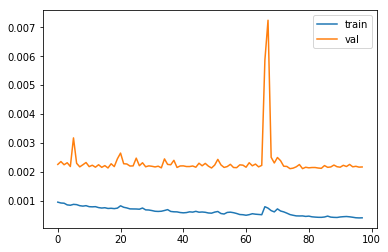

In [69]:
plt.plot(hist.history['loss'][2:], label='train')
plt.plot(hist.history['val_loss'][2:], label='val')
plt.legend()

In [25]:
n_test_images = 40
# X_test = np.asarray([path2XY(path)[0] for path in image_paths[-n_test_images:]])
# Y_test = np.asarray([path2XY(path)[1] for path in image_paths[-n_test_images:]])
X_test = np.asarray([path2XY(path)[0] for path in image_paths[-40:]])
Y_test = np.asarray([path2XY(path)[1] for path in image_paths[-40:]])
pred = model.predict(X_test)

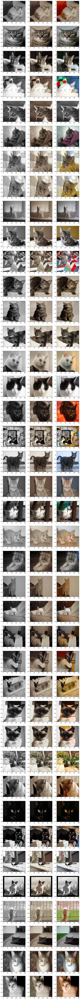

In [26]:
f, axarr = plt.subplots(n_test_images,3, figsize = (15,n_test_images*5))
for idx in range(n_test_images):
    axarr[idx,0].imshow(denorm_to_plot(X_test[idx]),aspect="auto")
    axarr[idx,1].imshow(lab2rgb(pred[idx]),aspect="auto")
    axarr[idx,2].imshow(lab2rgb(Y_test[idx]),aspect="auto")


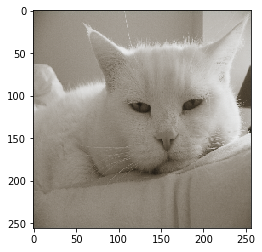

In [122]:
plt.imshow(pred[0])

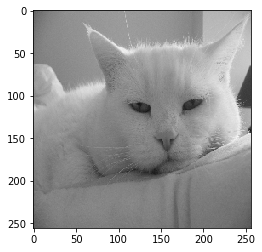

In [123]:
plt.imshow(denorm_to_plot(X_test[0]))

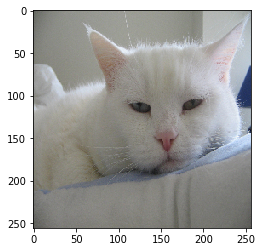

In [23]:
plt.imshow(Y_test[0])

In [156]:
Y_test[0].shape

(256, 256, 3)

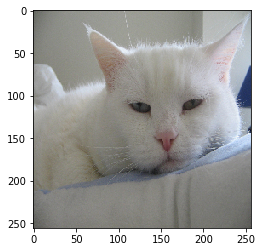

In [158]:
plt.imshow(Y_test[0])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


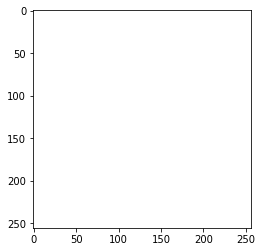

In [79]:
# Show image from batch
pred = 255.*pred
pred = np.reshape(pred[0], (256,256,3))
plt.imshow(pred)

In [ ]:
model.fit()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


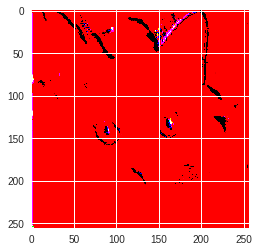

In [ ]:
model.add(Dense(20, activation='tanh'))
model.add(Dense(20, activation='tanh'))
model.add(Dense(20, activation='tanh'))
model.add(Dense(20, activation='tanh'))
model.add(Dense(3, activation='sigmoid'))



In [ ]:
model.add(Dense(10, activation='tanh'))
model.add(Dense(3, activation='sigmoid'))

In [ ]:
#model.predict(np.asarray([2,3]))
x = np.linspace(-10,10,500)
y = np.linspace(-10,10,500)
xy = np.meshgrid(x,y)

In [ ]:
tensor_data = []

for i, xi  in enumerate(x):
  for j, yj in enumerate(y):
    tensor_data.append([xi,yj])

tensor_data =np.asarray(tensor_data)

In [ ]:
tensor_data.shape

(250000, 2)

In [ ]:
output = model.predict(tensor_data)

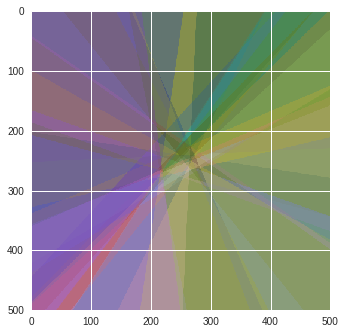

In [ ]:
reshaped = np.reshape(output, (500,500,3))

import matplotlib.pyplot as plt
#plt.figure((20,20))
plt.imshow(reshaped)